# **IMPORT LIBRARY**


In [1]:
import os
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import tensorflow as tf
import time  

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Input,
    Dense,
    Dropout,
    BatchNormalization,
    Flatten
)
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing import image

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, classification_report, confusion_matrix, 
    roc_curve, auc
)
warnings.filterwarnings("ignore")

2026-04-11 00:14:07.314449: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1775866447.523764      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1775866447.574854      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1775866448.023346      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775866448.023404      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775866448.023407      55 computation_placer.cc:177] computation placer alr

# **SET RANDOM SEED**

In [2]:
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"  
os.environ["KMP_WARNINGS"] = "0"
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# **DATA ACQUISITION**


In [3]:
colon_dir = '/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets'
lung_dir  = '/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets'

def generate_df(image_dir):
    filepaths, labels = [], []
    for folder in os.listdir(image_dir):
        folder_path = os.path.join(image_dir, folder)
        for file in os.listdir(folder_path):
            filepaths.append(os.path.join(folder_path, file))
            labels.append(folder)
    return filepaths, labels

colon_fp, colon_lb = generate_df(colon_dir)
lung_fp, lung_lb   = generate_df(lung_dir)

df = pd.DataFrame({
    "filepath": colon_fp + lung_fp,
    "label": colon_lb + lung_lb
})

print("Total Images:", len(df))
print(df["label"].value_counts())


Total Images: 25000
label
colon_aca    5000
colon_n      5000
lung_aca     5000
lung_scc     5000
lung_n       5000
Name: count, dtype: int64


# **DATA VISUALIZATION**

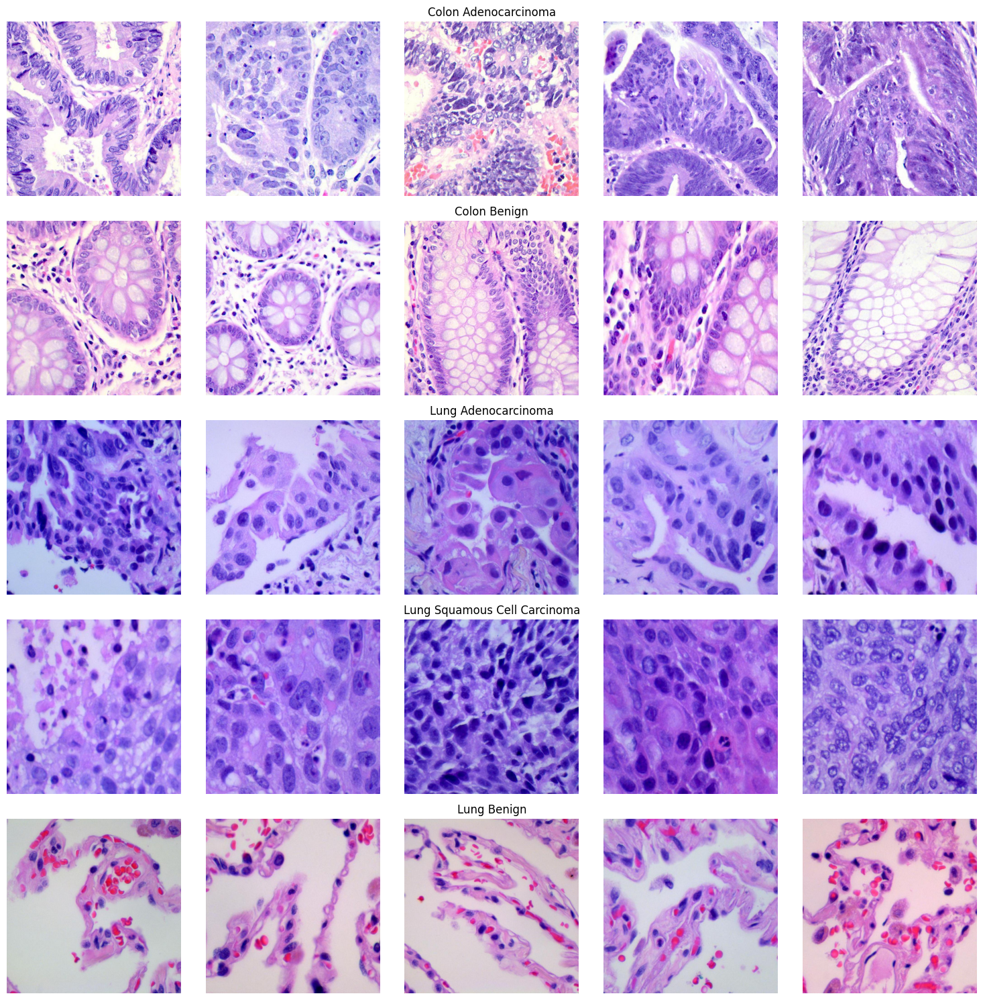

In [4]:
class_directories = {
    'Colon Adenocarcinoma': os.path.join(colon_dir, 'colon_aca'),
    'Colon Benign': os.path.join(colon_dir, 'colon_n'),
    'Lung Adenocarcinoma': os.path.join(lung_dir, 'lung_aca'),
    'Lung Squamous Cell Carcinoma': os.path.join(lung_dir, 'lung_scc'),
    'Lung Benign': os.path.join(lung_dir, 'lung_n')
}

n_images = 5
fig, axes = plt.subplots(len(class_directories), n_images, figsize=(15, 15))

for i, (cls, path) in enumerate(class_directories.items()):
    files = random.sample(os.listdir(path), n_images)
    for j, f in enumerate(files):
        img = mpimg.imread(os.path.join(path, f))
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 2:
            axes[i, j].set_title(cls, fontsize=12)

plt.tight_layout()
plt.show()


# **DATA PRE-PROCESSING**


In [5]:
IMG_SIZE   = 224
BATCH_SIZE = 64

# ============================================================
# DATA SPLITTING (LC25000)
# 20.000 Training | 5.000 Testing
# ============================================================

TOTAL_DATA = len(df)
TEST_RATIO = 5000 / TOTAL_DATA

train_df, test_df = train_test_split(
    df,
    test_size=TEST_RATIO,
    random_state=SEED,
    stratify=df["label"]
)

print("Training Data :", len(train_df))
print("Testing Data  :", len(test_df))


Training Data : 20000
Testing Data  : 5000


# **IMAGE DATA GENERATOR**

In [6]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    width_shift_range=0.05, 
    height_shift_range=0.05,
    rotation_range=15,        
    zoom_range=0.1,      
    horizontal_flip=True,    
    fill_mode="nearest"
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input   # 🔹 NORMALIZATION
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col="filepath",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),          # 🔹 RESIZE
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=True
)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col="filepath",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),          # 🔹 RESIZE
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

Found 20000 validated image filenames belonging to 5 classes.
Found 5000 validated image filenames belonging to 5 classes.


# **VISUALISASI AUGMENTASI**

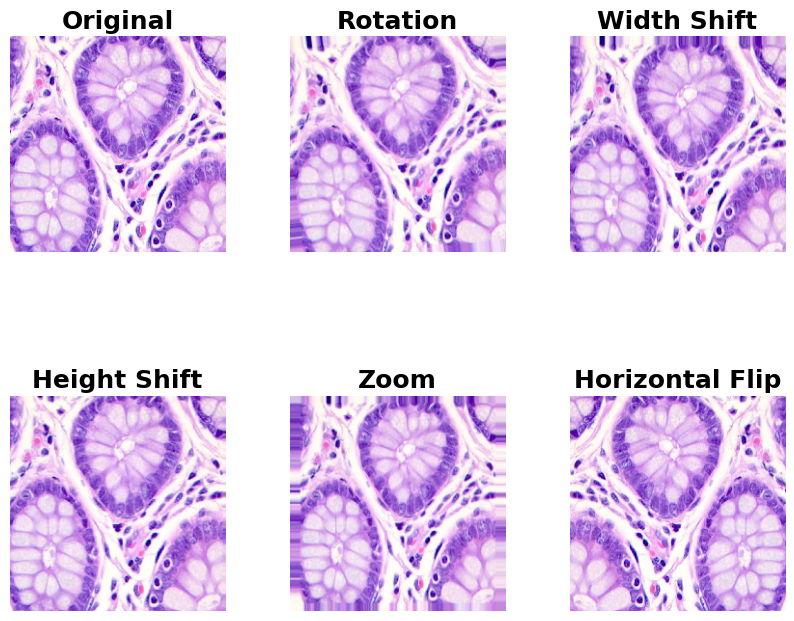

In [7]:
plt.figure(figsize=(10, 8))

img_path = train_df["filepath"].iloc[0]
img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
img_array = np.expand_dims(img_to_array(img), axis=0)

augmentations = {
    "Original": ImageDataGenerator(preprocessing_function=preprocess_input),
    "Rotation": ImageDataGenerator(preprocessing_function=preprocess_input, rotation_range=15),
    "Width Shift": ImageDataGenerator(preprocessing_function=preprocess_input, width_shift_range=0.05),
    "Height Shift": ImageDataGenerator(preprocessing_function=preprocess_input, height_shift_range=0.05),
    "Zoom": ImageDataGenerator(preprocessing_function=preprocess_input, zoom_range=0.1),
    "Horizontal Flip": ImageDataGenerator(preprocessing_function=preprocess_input, horizontal_flip=True)
}

for i, (title, aug) in enumerate(augmentations.items()):
    
    aug_iter = aug.flow(img_array, batch_size=1)
    aug_img = next(aug_iter)[0]

    aug_img = (aug_img - aug_img.min()) / (aug_img.max() - aug_img.min())
    
    plt.subplot(2, 3, i+1)
    plt.imshow(aug_img)
    
    plt.title(title, fontsize=18, fontweight="bold")
    plt.axis("off")

plt.subplots_adjust(hspace=0.4, wspace=0.3)

plt.show()

# **BUILD AND MODEL SELECTION**

In [8]:
NUM_CLASSES = 5  # jumlah kelas

# 1️⃣ Input
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# 2️⃣ Base model EfficientNetB3
base_model = EfficientNetB3(
    include_top=False,
    weights="imagenet",
    input_tensor=inputs
)

# Freeze semua layer
for layer in base_model.layers:
    layer.trainable = False
    
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)

outputs = Dense(NUM_CLASSES, activation="softmax")(x)

model = Model(inputs, outputs)

model.compile(
    optimizer=RMSprop(learning_rate=1e-4),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

I0000 00:00:1775866537.745171      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        960 │ block1a_se_excit

 Total params: 10,980,916 (41.89 MB)

 Trainable params: 197,381 (771.02 KB)

 Non-trainable params: 10,783,535 (41.14 MB)

# **TRAINING**

In [9]:
callbacks = [
    EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    ),
    ReduceLROnPlateau(
        monitor="val_loss",
        patience=3,
        factor=0.3,
        verbose=1
    ),
    ModelCheckpoint(
        "efficientnetB3_RMSprop.keras",
        monitor="val_loss",
        save_best_only=True,
        verbose=1
    )
]

# 1️⃣ Catat waktu mulai
start_total_training = time.time()

history = model.fit(
    train_generator,
    validation_data=test_generator,  
    epochs=100,
    callbacks=callbacks,
)

# 3️⃣ Catat waktu selesai
end_total_training = time.time()

# 🔧 OUTPUT DALAM DETIK & MENIT
total_time_sec = end_total_training - start_total_training
total_time_min = total_time_sec / 60

print(f"Total Waktu Training: {total_time_sec:.4f} detik")
print(f"Total Waktu Training: {total_time_min:.2f} menit")

Epoch 1/100


I0000 00:00:1775866563.119421     125 service.cc:152] XLA service 0x7d67dc01e370 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1775866563.119472     125 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1775866567.263431     125 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1775866588.912643     125 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7018 - loss: 0.8219
Epoch 1: val_loss improved from inf to 0.20293, saving model to efficientnetB3_RMSprop.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 552s 2s/step - accuracy: 0.7022 - loss: 0.8209 - val_accuracy: 0.9312 - val_loss: 0.2029 - learning_rate: 1.0000e-04
Epoch 2/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 960ms/step - accuracy: 0.9139 - loss: 0.2489
Epoch 2: val_loss improved from 0.20293 to 0.14180, saving model to efficientnetB3_RMSprop.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 329s 1s/step - accuracy: 0.9139 - loss: 0.2488 - val_accuracy: 0.9480 - val_loss: 0.1418 - learning_rate: 1.0000e-04
Epoch 3/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 985ms/step - accuracy: 0.9383 - loss: 0.1829
Epoch 3: val_loss improved from 0.14180 to 0.11640, saving model to efficientnetB3_RMSprop.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 339s 1s/step - accuracy: 0.9383 - loss: 0.1829 - val_accuracy: 0.9574 - val_loss: 0.1164 - learning_rate: 1.0000e-04
Epoch 4/100
313/313 ━━━

# **EVALUATION**

In [10]:
test_generator.reset()
y_pred_prob = model.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = test_generator.classes

accuracy  = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average="weighted")
recall    = recall_score(y_true, y_pred, average="weighted")
f1        = f1_score(y_true, y_pred, average="weighted")

print(f"Accuracy  : {accuracy:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-Score  : {f1:.4f}")

class_names = list(test_generator.class_indices.keys())
print(classification_report(y_true, y_pred, target_names=class_names))

79/79 ━━━━━━━━━━━━━━━━━━━━ 47s 462ms/step
Accuracy  : 0.9928
Precision : 0.9928
Recall    : 0.9928
F1-Score  : 0.9928
              precision    recall  f1-score   support

   colon_aca       1.00      1.00      1.00      1000
     colon_n       1.00      1.00      1.00      1000
    lung_aca       0.98      0.99      0.98      1000
      lung_n       1.00      1.00      1.00      1000
    lung_scc       0.99      0.98      0.99      1000

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



# **ACCURACY CURVE**

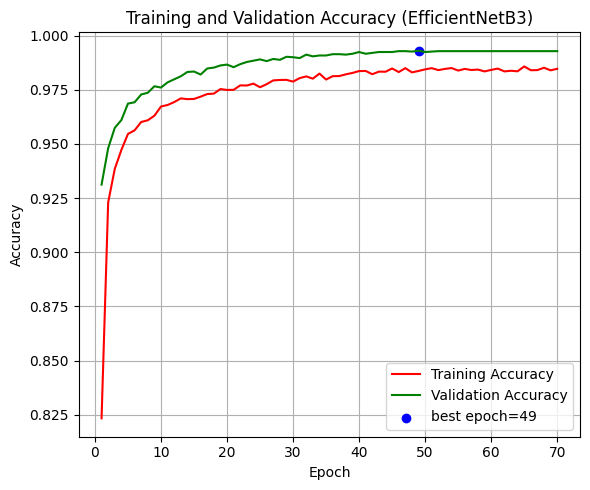

In [11]:
# ambil data
train_acc = history.history['accuracy']
val_acc   = history.history['val_accuracy']

# epoch
epochs = range(1, len(train_acc) + 1)

# cari best epoch
best_acc_epoch = np.argmax(val_acc) + 1

# ======================
# Plot Accuracy
# ======================
plt.figure(figsize=(6, 5))
plt.plot(epochs, train_acc, 'r-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'g-', label='Validation Accuracy')

plt.scatter(best_acc_epoch, val_acc[best_acc_epoch-1],
            c='blue', marker='o',
            label=f'best epoch={best_acc_epoch}')

plt.title('Training and Validation Accuracy (EfficientNetB3)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# **LOSS CURVE**

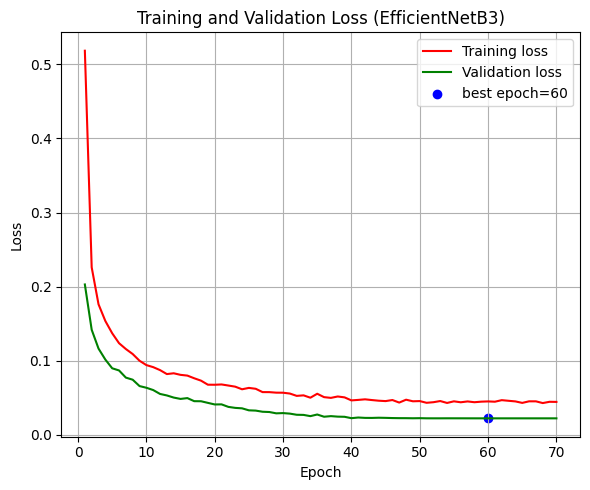

In [12]:
train_loss = history.history['loss']
val_loss   = history.history['val_loss']

best_loss_epoch = np.argmin(val_loss) + 1

# ======================
# Plot Loss
# ======================
plt.figure(figsize=(6, 5))
plt.plot(epochs, train_loss, 'r-', label='Training loss')
plt.plot(epochs, val_loss, 'g-', label='Validation loss')

plt.scatter(best_loss_epoch, val_loss[best_loss_epoch-1],
            c='blue', marker='o',
            label=f'best epoch={best_loss_epoch}')

plt.title('Training and Validation Loss (EfficientNetB3)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# **ROC CURVE**

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 337ms/step


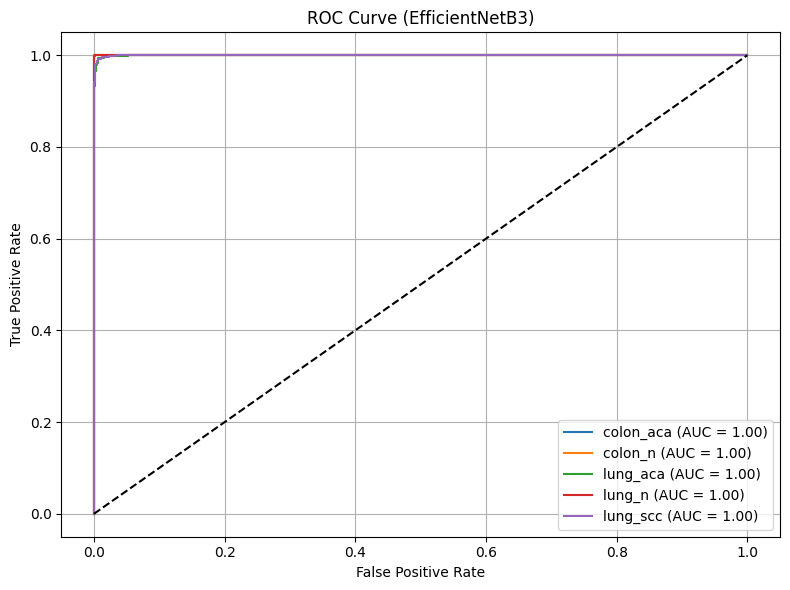

In [13]:
# jumlah kelas
n_classes = len(class_names)

# Ambil label asli dari test_generator
y_true = test_generator.classes

# Ubah label ke one-hot
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# 🔥 Ambil probabilitas prediksi dari generator
y_score = model.predict(test_generator)

# Hitung ROC per kelas
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# ==========================
# Plot ROC Curve
# ==========================
plt.figure(figsize=(8, 6))

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

# Garis diagonal baseline
plt.plot([0, 1], [0, 1], 'k--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (EfficientNetB3)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# **CONFUSION MATRIX**

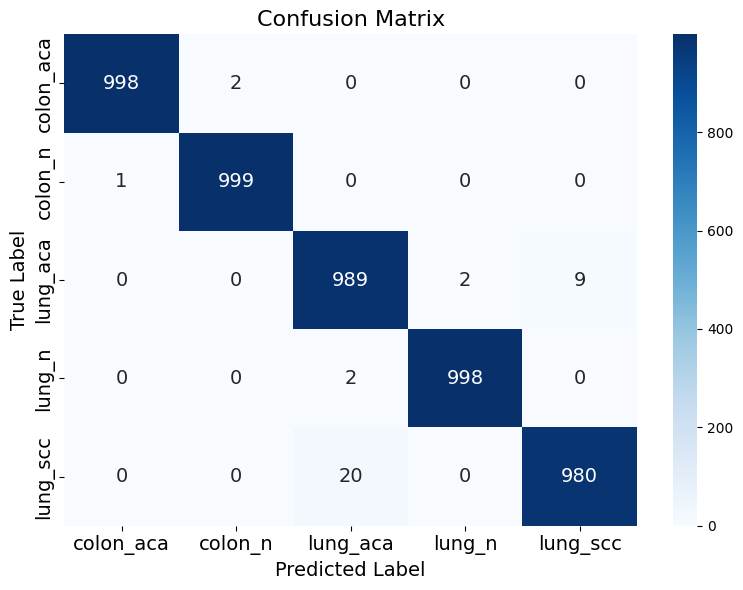

In [14]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names,
            annot_kws={"size": 14})  # 🔥 tambah ini

plt.xlabel("Predicted Label", fontsize=14)  # tambah fontsize
plt.ylabel("True Label", fontsize=14)
plt.title("Confusion Matrix", fontsize=16)

plt.xticks(fontsize=14)  # label kelas
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

# **PREDICTION SAMPLE**

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


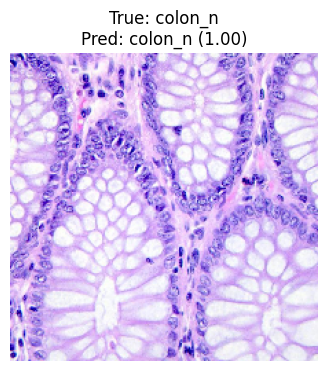

Image Path        : /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn2966.jpeg
True Label        : colon_n
Predicted Label   : colon_n
Confidence        : 0.9999994
Prediction Prob.  : [[4.2731378e-07 9.9999940e-01 1.4558917e-07 9.9961296e-11 4.6629784e-09]]

Top 3 Predictions:
colon_n: 1.0000
colon_aca: 0.0000
lung_aca: 0.0000


In [15]:
# Ambil random sample
sample = test_df.sample(n=1).iloc[0]

image_path = sample["filepath"]
true_label = sample["label"]

# Load image
img = image.load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)

# Normalization (SUDAH BENAR)
img_array = preprocess_input(img_array)

# Prediction
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction, axis=1)[0]

# Mapping
class_labels = {v: k for k, v in train_generator.class_indices.items()}
predicted_class_name = class_labels[predicted_class_index]

confidence = np.max(prediction)

# Visualization
plt.figure(figsize=(4, 4))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"True: {true_label}\nPred: {predicted_class_name} ({confidence:.2f})"
)
plt.show()

# Output
print("Image Path        :", image_path)
print("True Label        :", true_label)
print("Predicted Label   :", predicted_class_name)
print("Confidence        :", confidence)
print("Prediction Prob.  :", prediction)

# Top-3
top_indices = prediction[0].argsort()[-3:][::-1]

print("\nTop 3 Predictions:")
for i in top_indices:
    print(f"{class_labels[i]}: {prediction[0][i]:.4f}")

# **GRAD-CAM**

In [16]:
# Pastikan model sudah built dengan input shape yang sama
if not model.built:
    _ = model(tf.zeros((1, IMG_SIZE, IMG_SIZE, 3)))

# Cari layer convolution terakhir (output shape = 4D: batch x H x W x C)
LAST_CONV_LAYER = None
for layer in reversed(model.layers):
    # cek apakah layer memiliki output 4 dimensi (H x W x C)
    if len(layer.output.shape) == 4:
        LAST_CONV_LAYER = layer.name
        break

if LAST_CONV_LAYER is None:
    raise ValueError("❌ Tidak ada layer convolution 4D ditemukan di model.")

print("✅ Last Conv Layer untuk Grad-CAM:", LAST_CONV_LAYER)

✅ Last Conv Layer untuk Grad-CAM: top_activation


In [17]:
# ==========================
# LIST IMAGE
# ==========================
img_paths = [
    "/kaggle/input/datasets/steveumbass/ujicoba/colon_aca.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/colon_n.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_aca1.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_n.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_scc.jpg"
]

# ==========================
# Fungsi load image
# ==========================
def load_image(img_path, preprocess=True):
    img = tf.keras.preprocessing.image.load_img(
        img_path, target_size=(IMG_SIZE, IMG_SIZE)
    )
    img = tf.keras.preprocessing.image.img_to_array(img)
    if preprocess:
        img = preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    return img

# ==========================
# Loop semua gambar
# ==========================
preprocessed_images = []
original_images = []

for path in img_paths:
    # Untuk model
    preprocessed_images.append(load_image(path, preprocess=True))
    
    # Untuk visualisasi asli
    orig = load_image(path, preprocess=False).astype("uint8")
    original_images.append(orig)

In [18]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):

    # Ambil last conv layer dari FULL model
    last_conv_layer = model.get_layer(last_conv_layer_name)

    # Buat grad model langsung dari model lengkap
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[
            last_conv_layer.output,
            model.output
        ]
    )

    with tf.GradientTape() as tape:

        conv_outputs, predictions = grad_model(img_array)

        print("Predictions:", predictions.numpy())

        class_index = tf.argmax(predictions[0])

        print("Predicted class:", class_index.numpy())

        loss = predictions[:, class_index]

    # Hitung gradient
    grads = tape.gradient(loss, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    heatmap = tf.maximum(heatmap, 0)

    heatmap = heatmap - tf.reduce_min(heatmap)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)
    heatmap = heatmap.numpy()
    heatmap = np.power(heatmap, 0.4)
    return heatmap


In [19]:
def show_gradcam(img_path, heatmap, mask=None, alpha=0.6):

    img = cv2.imread(img_path)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))  # BGR

    heatmap = cv2.resize(
        heatmap,
        (IMG_SIZE, IMG_SIZE),
        interpolation=cv2.INTER_CUBIC
    )

    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 0.3, heatmap_color, 0.7, 0)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(18,5))

    plt.subplot(1,3,1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(overlay_rgb)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")

    plt.show()


🖼 Image Path: /kaggle/input/datasets/steveumbass/ujicoba/colon_aca.jpg
Predictions: [[9.9970680e-01 1.3396992e-05 2.4549876e-05 4.3952016e-07 2.5477284e-04]]
Predicted class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Predicted class: Colon Adenocarcinoma
Confidence: 0.9997


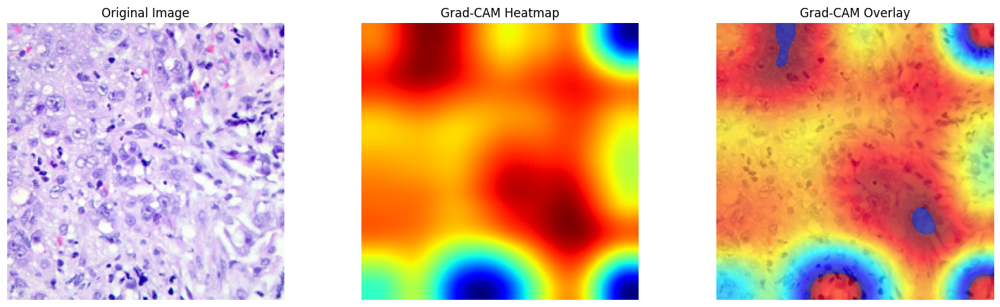


🖼 Image Path: /kaggle/input/datasets/steveumbass/ujicoba/colon_n.jpg
Predictions: [[1.0649284e-06 9.9999857e-01 2.3049368e-07 6.4982042e-10 6.8956005e-08]]
Predicted class: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Predicted class: Colon Benign
Confidence: 1.0000


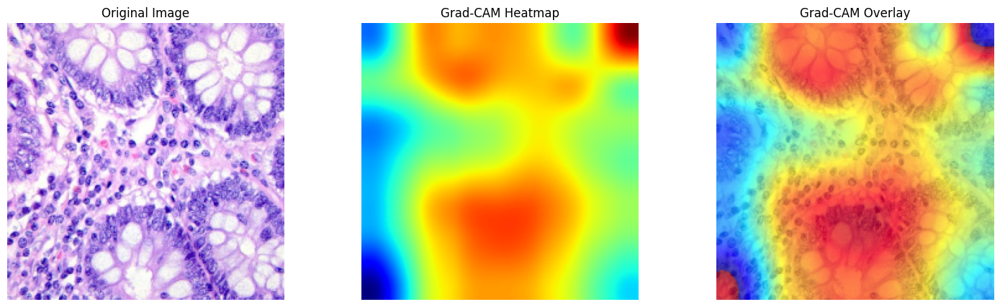


🖼 Image Path: /kaggle/input/datasets/steveumbass/ujicoba/lung_aca1.jpg
Predictions: [[4.2897413e-04 5.7244430e-05 9.9943620e-01 7.6921271e-05 5.7939315e-07]]
Predicted class: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Predicted class: Lung Adenocarcinoma
Confidence: 0.9994


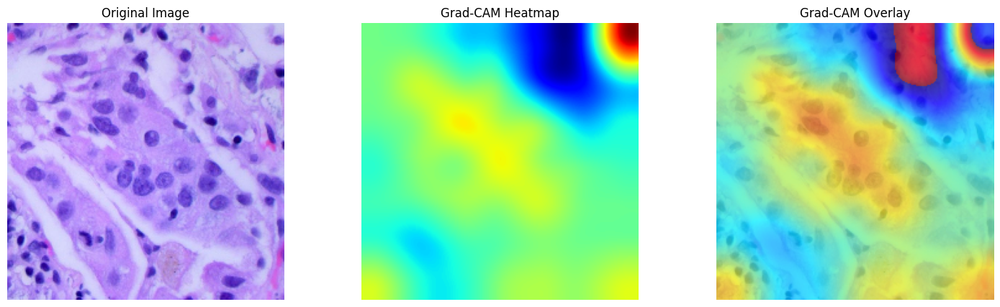


🖼 Image Path: /kaggle/input/datasets/steveumbass/ujicoba/lung_n.jpg
Predictions: [[8.1719378e-08 5.1404458e-09 2.6855530e-04 9.9973136e-01 1.4909110e-08]]
Predicted class: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Predicted class: Lung Benign
Confidence: 0.9997


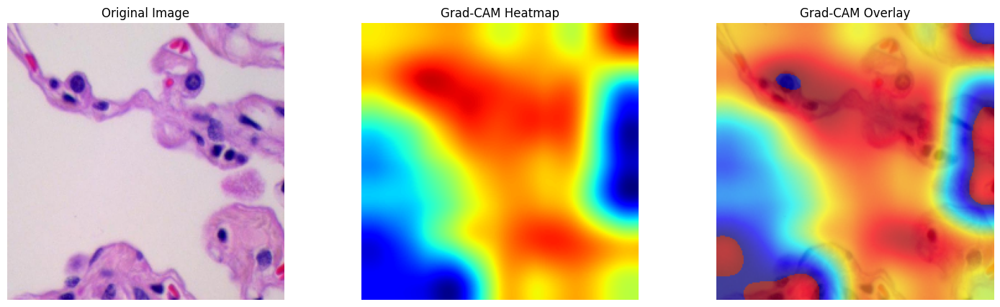


🖼 Image Path: /kaggle/input/datasets/steveumbass/ujicoba/lung_scc.jpg
Predictions: [[2.8018944e-06 2.7802816e-09 4.3872204e-03 4.5218144e-08 9.9560994e-01]]
Predicted class: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Predicted class: Lung Squamous Cell Carcinoma
Confidence: 0.9956


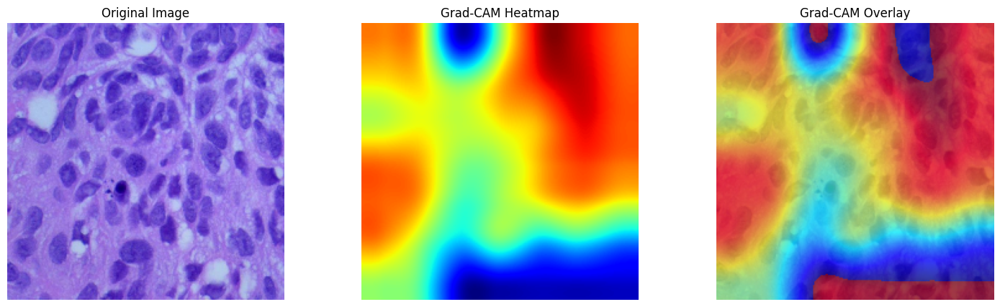

In [20]:
# ==========================
# LIST IMAGE
# ==========================
img_paths = [
    "/kaggle/input/datasets/steveumbass/ujicoba/colon_aca.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/colon_n.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_aca1.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_n.jpg",
    "/kaggle/input/datasets/steveumbass/ujicoba/lung_scc.jpg"
]

# ==========================
# CLASS NAMES
# ==========================
class_names = [
    "Colon Adenocarcinoma",
    "Colon Benign",
    "Lung Adenocarcinoma",
    "Lung Benign",
    "Lung Squamous Cell Carcinoma"
]

# ==========================
# LOOP SEMUA GAMBAR
# ==========================
for img_path in img_paths:
    print("\n🖼 Image Path:", img_path)

    # load image
    img_array = load_image(img_path)

    # gradcam
    heatmap = make_gradcam_heatmap(
        img_array,
        model,
        LAST_CONV_LAYER
    )

    # prediksi (pakai probabilitas)
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds)

    # label
    predicted_label = class_names[predicted_class]
    confidence = np.max(preds)

    print("Predicted class:", predicted_label)
    print("Confidence:", f"{confidence:.4f}")

    # tampilkan gradcam
    show_gradcam(img_path, heatmap)

In [21]:
# img_path1 ="/kaggle/input/datasets/emanhamam/lung-and-colon-cancer-histopathological-dataset/lung-and-colon-cancer-histopathological-dataset/train/images/colon_aca_colonca1009_jpeg.rf.0d3da5d5d831e2bfed1b6153366ccea3.jpg"
# img_path2 ="/kaggle/input/datasets/emanhamam/lung-and-colon-cancer-histopathological-dataset/lung-and-colon-cancer-histopathological-dataset/train/images/colon_n_colonn1384_jpeg.rf.1aa6f249337ea0a360d52e2d102f68d3.jpg"
# img_path3 ="/kaggle/input/datasets/rm1000/lung-cancer-histopathological-images/adenocarcinoma/0000.jpg"
# img_path4 ="/kaggle/input/datasets/rm1000/lung-cancer-histopathological-images/benign/0000.jpg"
# img_path5 ="/kaggle/input/datasets/rm1000/lung-cancer-histopathological-images/squamous_cell_carcinoma/0000.jpg"

# print("🖼 Image Path:", img_path)

# # mapping index ke nama kelas
# class_names = [
#     "Colon Adenocarcinoma",
#     "Colon Benign",
#     "Lung Adenocarcinoma",
#     "Lung Benign",
#     "Lung Squamous Cell Carcinoma"
# ]

# img_array = load_image(img_path)

# heatmap = make_gradcam_heatmap(
#     img_array,
#     model,
#     LAST_CONV_LAYER
# )

# predicted_class = np.argmax(model.predict(img_array))

# # tambahkan label kelas
# predicted_label = class_names[predicted_class]
# print("Predicted class:", predicted_label)

# show_gradcam(img_path, heatmap)

In [22]:
# Pastikan folder /kaggle/working ada
save_dir = "/kaggle/working"

# ===============================
# Simpan model di /kaggle/working
# ===============================
model.save(os.path.join(save_dir, "efficientnetB3_RMSprop.h5"))     # format HDF5
model.save(os.path.join(save_dir, "efficientnetB3_RMSprop.keras"))  # format Keras modern

print("✅ Model tersimpan di /kaggle/working")


✅ Model tersimpan di /kaggle/working
